In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import math
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
import pygraphviz
import matplotlib.pyplot as plt

In [2]:
def corr_matrix(df, window=250, enddate="2017-01-24", method="gower"):
    """To generate correlation matrix for a certain period, method = 'gower' or 'power'"""
    end = int(np.where(df.index==enddate)[0])
    start = end - window + 1
    sub = df[start:end+1]
    #print(sub)
    corr_mat = sub.corr(min_periods=150)
    if method == "gower":
        corr_mat = (2-2*corr_mat[corr_mat.notnull()])**0.5# gower
    elif method == "power":
        corr_mat = 1-corr_mat[corr_mat.notnull()]**2# power
    #corr_mat.apply(lambda x:1-x**2 if not math.isnan(x) else np.nan)
    return corr_mat
## still need to deal with the situation when enddate is not in the index.

In [3]:
def rolling_corr(df, window=250, enddate="2017-01-24", startdate='2005-01-03',space=10):
    """Return a dictionary of correlation matrices.
    The key is the enddate of the window, the value is corresponding correlation matrix"""
    end = int(np.where(df.index==enddate)[0])
    start = int(np.where(df.index==startdate)[0])
    space = -space
    dates = df.index.values
    dates = dates[end:start:space]
    result = {}
    for d in dates:
        d = pd.to_datetime(d).strftime("%Y-%m-%d")
        result[str(d)] = corr_matrix(df, window, enddate=d)
    return result

In [4]:
def constructgraph(corr_matrix):
    """Convert a correlation matrix to a graph"""
    G = nx.from_numpy_matrix(corr_matrix.values)
    mapping = dict(zip(list(range(127)),list(corr_matrix.index)))
    G = nx.relabel_nodes(G, mapping, copy=False)
    #delete NAN weights
    for (u,v,d) in G.edges(data=True):
        if math.isnan(d["weight"]):
            G.remove_edges_from([(u,v)])
    #delete self-connected edges
    for (u,v,d) in G.edges(data=True):
        if u==v:
            G.remove_edges_from([(u,v)])
    #delete nodes whose degree is 0
    nodes = list(G.nodes())
    for node in nodes:
        if G.degree(node) == 0:
            G.remove_node(node)
    return G

In [5]:
def draw_network(G):
    # Define a layout for the graph
    #pos=nx.spring_layout(G) # positions for all nodes
    pos=graphviz_layout(G) # positions for all nodes
    fig=plt.figure(1,figsize=(40,40)) #Let's draw a big graph so that it is clearer

    # draw the nodes: red, sized, transperancy
    nx.draw_networkx_nodes(G, pos, 
                           node_color='r',
                           node_size=100,
                           alpha=.8)

    # draw the edges
    nx.draw_networkx_edges(G,pos,
                           edgelist=list(G.edges()),
                           width=0.5,alpha=0.5,edge_color='b')


    node_name={}
    for node in G.nodes():
        node_name[node]=str(node)


    nx.draw_networkx_labels(G,pos,node_name,font_size=16)

    plt.axis('off')
    plt.show()

In [6]:
def weighted_degree_centrality(T):
    """Return a dictionary of weighted degree centrality for each node,
    the weighted degree is defined as (2-gower weight)"""
    for u,v,d in T.edges(data=True):
        d['weight2']=2-d['weight']
    degree = nx.degree(T,weight='weight2')
    degree = dict(degree)
    degree_c={}
    total=T.size(weight='weight2')
    for i in degree:
        degree_c[i]=degree[i]/total
    return degree_c

In [7]:
def portfolio(MST, c_measure, quantile=0.25, option='upper'):
    """Return a list of the upper or lower 25%(default) of stocks sorted by centrality"""
    if c_measure == 'closeness':
        centrality = nx.closeness_centrality(MST, distance="weight")
    elif c_measure == 'degree':
        centrality = weighted_degree_centrality(MST)
    elif c_measure == 'betweenness':
        centrality = nx.betweenness_centrality(MST)
    else:
        print('wrong centrality measure.')
    items = centrality.items()
    items.sort(key=lambda item: (item[1], item[0]))
    v=[item[1] for item in items]
    sorted_keys = [item[0] for item in items]
    number = int(len(sorted_keys)*quantile)
    if  option == 'lower':
        pos=len(v)-v[::-1].index(v[number])
        stock_list = sorted_keys[:pos]
    elif option == 'upper':
        if v[-number]==0:
            pos=len(v)-v[::-1].index(0)
        else: 
            pos=v.index(v[-number])
        stock_list = sorted_keys[pos:]
    return stock_list
    #return {k:centrality[k] for k in stock_list}

In [8]:
def port_change(list1,list2):
    """Calculate the percentage change between two stock lists"""
    count = 0
    if not list1:
        return None
    else:
        for x in list2:
            if x not in list1:
                count+=1.0
    return count/len(list2)

In [9]:
def getdata(dic):
    """Return a dataframe of portfolio change percentage for upper or lower quantile of three measures of centrality"""
    performance=pd.DataFrame(index=sorted(dic.keys()))
    for k in ['degree','closeness','betweenness']:
        print(k)
        for j in ['upper','lower']:
            print(j)
            change_dict={}
            portfolio_dict={}
            for key in sorted(dic.keys()):
                corr_matrix = dic[key]
                G=constructgraph(corr_matrix)
                T=nx.minimum_spanning_tree(G, "weight")
                #T = nx.algorithms.tree.mst.minimum_spanning_tree(G, weight='weight', algorithm='kruskal')
                portfolio_dict[key]=portfolio(T,c_measure=k,option=j)
            dates=sorted(portfolio_dict.keys())
            for i in range(0,len(dates)-1):
                list1 = portfolio_dict[dates[i]]
                list2 = portfolio_dict[dates[i+1]]
                change_dict[dates[i+1]] = port_change(list1,list2)
            p=pd.DataFrame(data=change_dict,index=[k+'_'+j]).T
            performance=pd.concat([performance,p],axis=1,join='inner')
    return performance

In [10]:
def importdata(filename):
    df = pd.read_csv(filename)
    # set date as index and sort by date
    df["Date"] = pd.to_datetime(df["Date"])
    df = df.set_index(pd.DatetimeIndex(df['Date']))
    df = df.drop(['Date'], axis=1)
    df.sort_index(inplace=True)
    # forward fill for NA
    df.fillna(method='ffill')
    # Log return
    log_ret = np.log(df) - np.log(df.shift(1))
    return df, log_ret

In [11]:
def do(filename="SP100_prices.csv", window=250, enddate="2017-01-24", startdate='2015-12-30',space=1):
    log_ret = importdata(filename)[1]
    dic = rolling_corr(log_ret, window, enddate, startdate, space)
    x = getdata(dic)
    upper = x[['betweenness_upper','closeness_upper','degree_upper']]
    lower = x[['betweenness_lower','closeness_lower','degree_lower']]
    #upper.plot(figsize=(20,8))
    #lower.plot(figsize=(20,8))
    return upper, lower

#### Following two cells take some time to run
#### Here we only focus on data from 2015-12-30 to 2017-01-24

In [12]:
upper, lower = do()

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


In [13]:
upper_2w, lower_2w = do(space=10)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


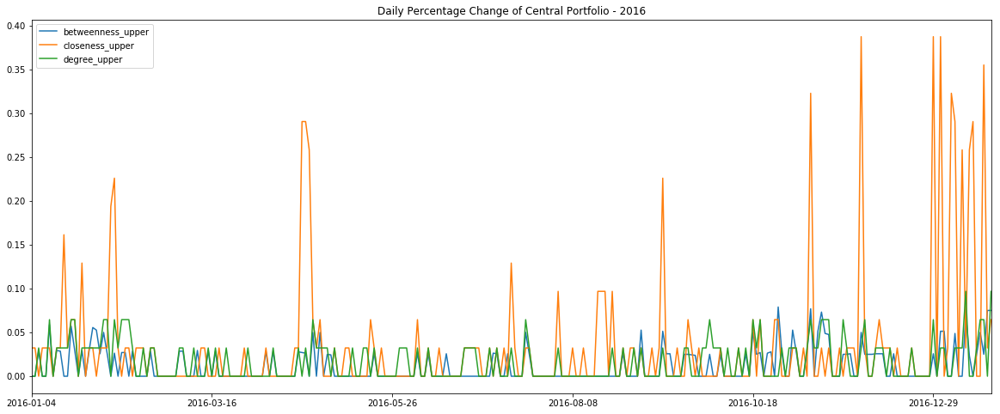

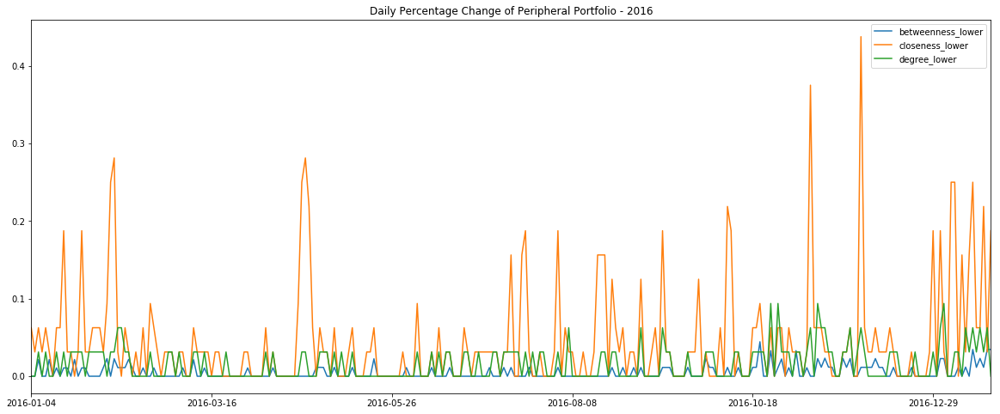

In [14]:
# import graphviz
%matplotlib inline
upper.plot(figsize=(20,8), title="Daily Percentage Change of Central Portfolio - 2016")
lower.plot(figsize=(20,8), title="Daily Percentage Change of Peripheral Portfolio - 2016")

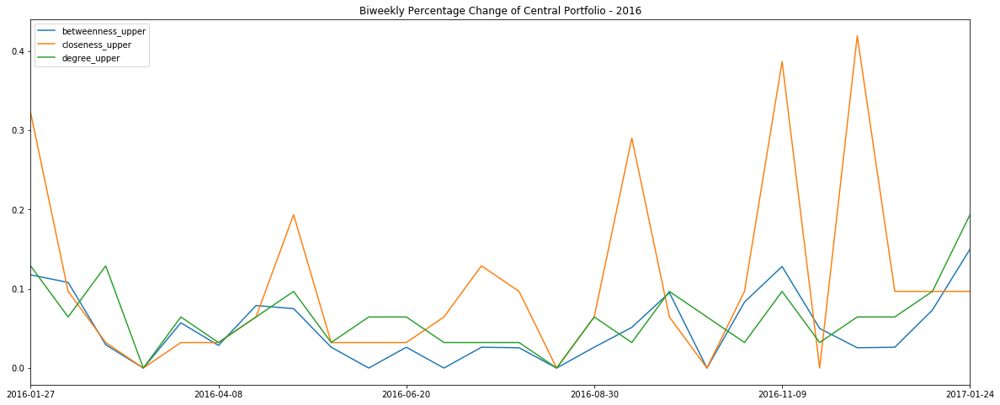

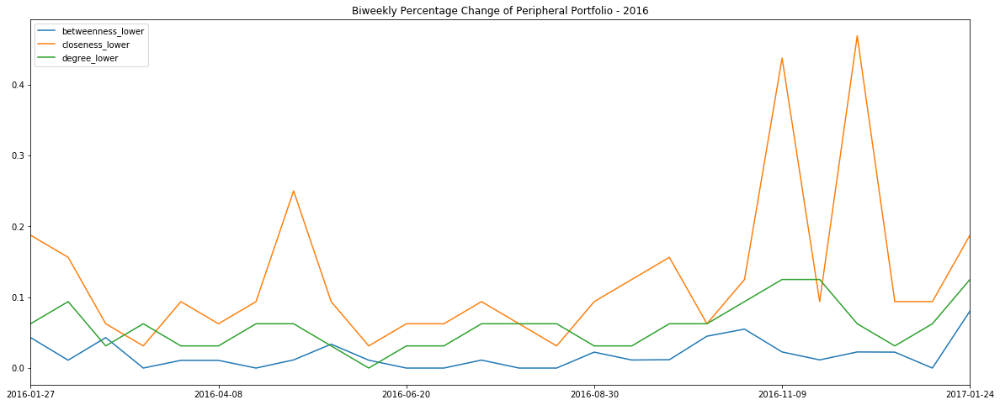

In [15]:
upper_2w.plot(figsize=(20,8), title="Biweekly Percentage Change of Central Portfolio - 2016")
lower_2w.plot(figsize=(20,8), title="Biweekly Percentage Change of Peripheral Portfolio - 2016")

In [16]:
alldata = pd.concat([upper, lower],axis=1,join='inner')
alldata_2w = pd.concat([upper_2w, lower_2w],axis=1,join='inner')

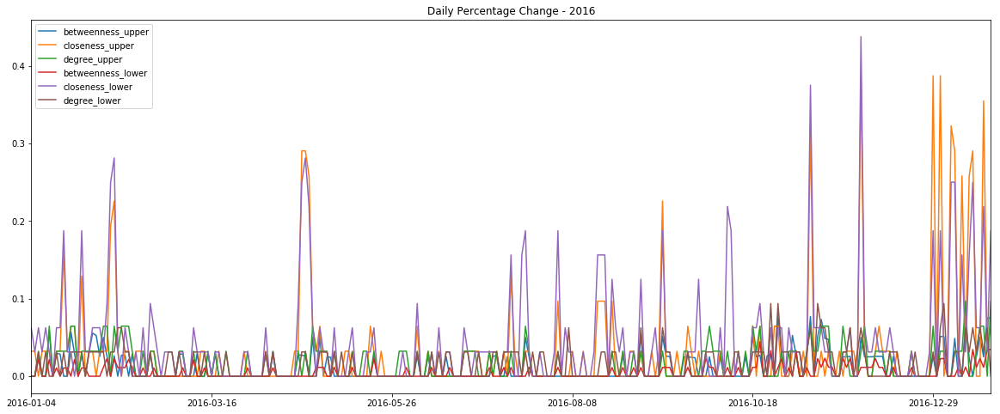

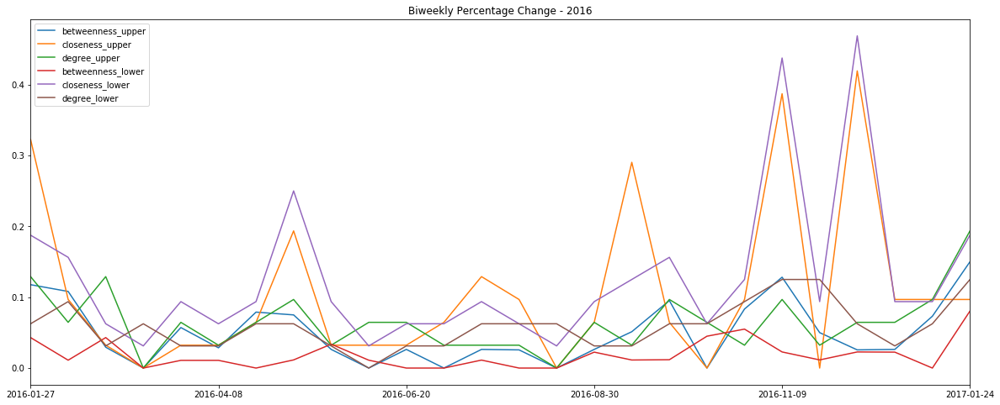

In [17]:
alldata.plot(figsize=(20,8), title="Daily Percentage Change - 2016")
alldata_2w.plot(figsize=(20,8), title="Biweekly Percentage Change - 2016")

In [18]:
# Scatter
# upper.plot(figsize=(20,8), title="Daily Percentage Change of Central Portfolio", style='.')
# lower.plot(figsize=(20,8), title="Daily Percentage Change of Peripheral Portfolio", style='.')
# upper_2w.plot(figsize=(20,8), title="Biweekly Percentage Change of Central Portfolio", style='.')
# lower_2w.plot(figsize=(20,8), title="Biweekly Percentage Change of Peripheral Portfolio", style='.')

#### All data

In [19]:
upper_all2w, lower_all2w = do(enddate="2017-01-24", startdate='2006-01-03', space=10)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


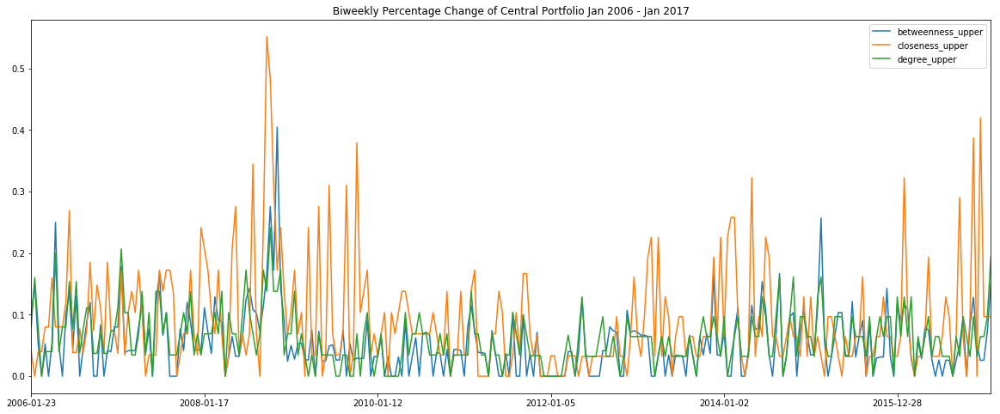

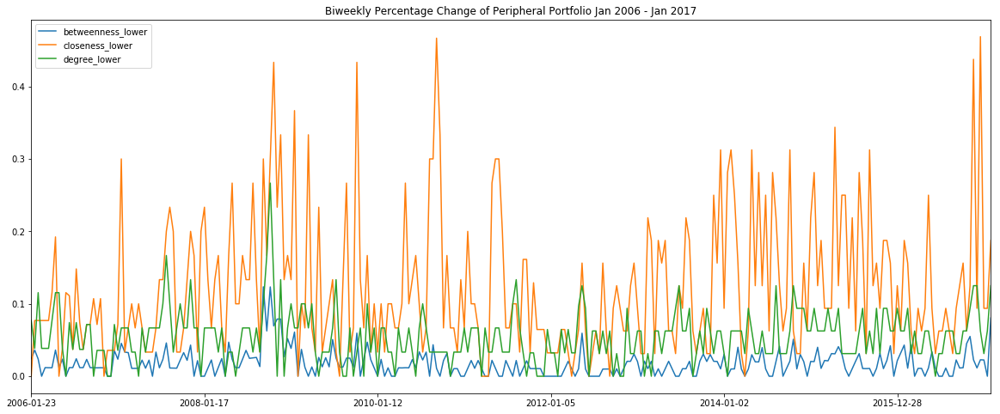

In [20]:
upper_all2w.plot(figsize=(20,8), title="Biweekly Percentage Change of Central Portfolio Jan 2006 - Jan 2017")
lower_all2w.plot(figsize=(20,8), title="Biweekly Percentage Change of Peripheral Portfolio Jan 2006 - Jan 2017")

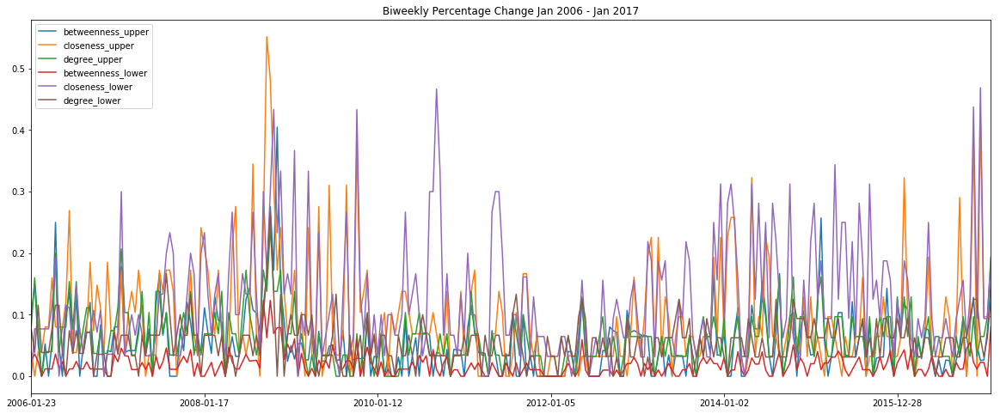

In [21]:
alldata_all2w = pd.concat([upper_all2w, lower_all2w],axis=1,join='inner')
alldata_all2w.plot(figsize=(20,8), title="Biweekly Percentage Change Jan 2006 - Jan 2017")

In [22]:
upper_all2w.sort(["closeness_upper"],ascending=[0]).head(10)

F:\Program Files (x86)\Anaconda3\envs\py2\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,betweenness_upper,closeness_upper,degree_upper
2008-10-03,0.166667,0.551724,0.137931
2008-10-17,0.275862,0.482759,0.241379
2016-12-08,0.025641,0.419355,0.064516
2016-11-09,0.128205,0.387097,0.096774
2009-10-15,0.029412,0.379310,0.068966
2008-08-07,0.108108,0.344828,0.068966
2016-01-27,0.117647,0.322581,0.129032
2014-04-29,0.115385,0.322581,0.096774
2009-09-02,0.000000,0.310345,0.034483
2009-06-23,0.048780,0.310345,0.034483


In [23]:
# price_all, log_ret_all = importdata("SP100_prices.csv")
# dic_all = rolling_corr(log_ret_all, window=250, enddate="2017-01-24", startdate='2006-01-03', space=10)
# p1 = getportfolio(dic_all, "betweenness", "upper")

In [24]:
# len(p1["2011-08-12"])

#### 2008

In [25]:
upper_08, lower_08 = do(enddate="2008-12-31", startdate='2008-01-02')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


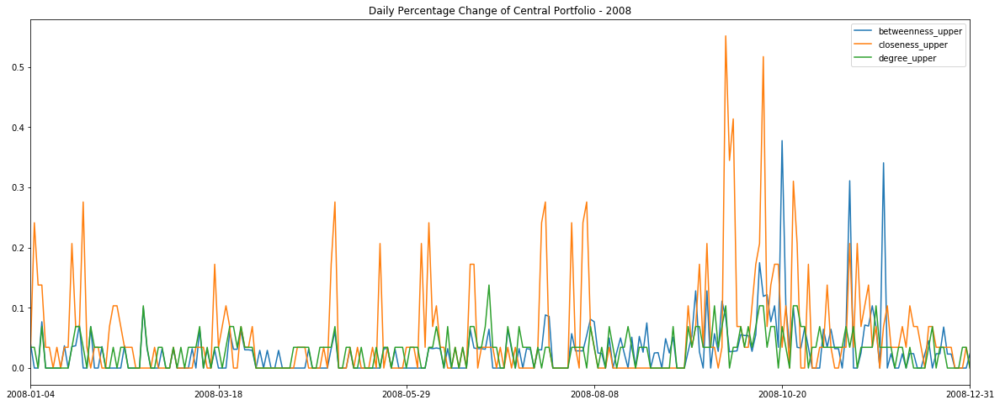

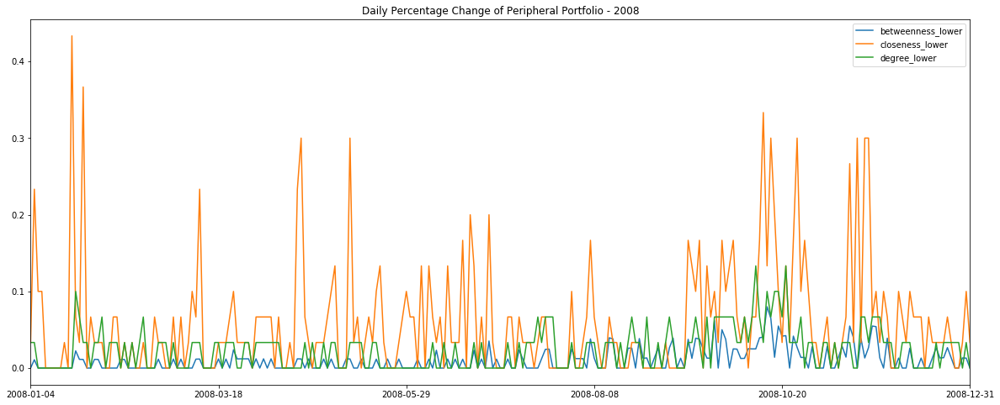

In [26]:
upper_08.plot(figsize=(20,8), title="Daily Percentage Change of Central Portfolio - 2008")
lower_08.plot(figsize=(20,8), title="Daily Percentage Change of Peripheral Portfolio - 2008")

In [27]:
upper_08.sort(["closeness_upper"],ascending=[0]).head(10)

F:\Program Files (x86)\Anaconda3\envs\py2\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,betweenness_upper,closeness_upper,degree_upper
2008-09-29,0.083333,0.551724,0.103448
2008-10-13,0.119048,0.517241,0.103448
2008-10-01,0.027778,0.413793,0.034483
2008-09-30,0.027027,0.344828,0.000000
2008-10-23,0.100000,0.310345,0.103448
2008-05-01,0.060606,0.275862,0.068966
2008-07-22,0.088235,0.275862,0.034483
2008-08-06,0.054054,0.275862,0.000000
2008-01-25,0.000000,0.275862,0.034483
2008-07-31,0.057143,0.241379,0.034483


#### Election

In [28]:
upper_elect, lower_elect = do(enddate="2017-01-24", startdate='2016-11-01')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


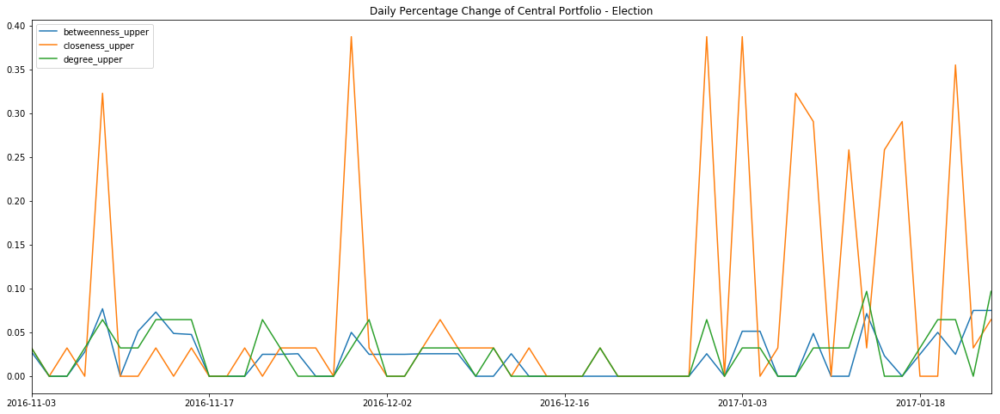

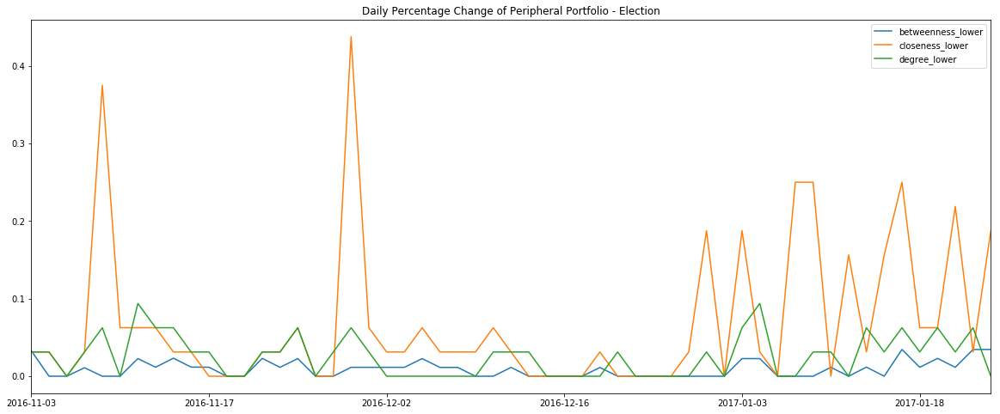

In [29]:
upper_elect.plot(figsize=(20,8), title="Daily Percentage Change of Central Portfolio - Election")
lower_elect.plot(figsize=(20,8), title="Daily Percentage Change of Peripheral Portfolio - Election")

In [30]:
upper_elect.sort(["closeness_upper"],ascending=[0]).head(10)

F:\Program Files (x86)\Anaconda3\envs\py2\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,betweenness_upper,closeness_upper,degree_upper
2017-01-03,0.051282,0.387097,0.032258
2016-11-30,0.050000,0.387097,0.032258
2016-12-29,0.025641,0.387097,0.064516
2017-01-20,0.025000,0.354839,0.064516
2017-01-06,0.000000,0.322581,0.000000
2016-11-09,0.076923,0.322581,0.064516
2017-01-17,0.000000,0.290323,0.000000
2017-01-09,0.048780,0.290323,0.032258
2017-01-13,0.023256,0.258065,0.000000
2017-01-11,0.000000,0.258065,0.032258


#### Performance

In [31]:
def getportfolio(dic,measure, option):
    """Return a dict of portfolio lists"""
    performance=pd.DataFrame(index=sorted(dic.keys()))
    portfolio_dict={}
    for key in sorted(dic.keys()):
        corr_matrix = dic[key]
        G=constructgraph(corr_matrix)
        T=nx.minimum_spanning_tree(G, "weight")
        #T = nx.algorithms.tree.mst.minimum_spanning_tree(G, weight='weight', algorithm='kruskal')
        portfolio_dict[key]=portfolio(T,c_measure=measure,option=option)
    return portfolio_dict

In [32]:
def perform(filename="SP100_prices.csv", window=250, enddate="2017-01-24", startdate='2015-12-30',space=1):
    pricedf, log_ret = importdata(filename)
    dic = rolling_corr(log_ret, window, enddate, startdate,space)
    dates = sorted(dic.keys())
    colnames = ["degree_upper", "degree_lower","closeness_upper","closeness_lower","betweenness_upper","betweenness_lower"]
    performance=pd.DataFrame(index=dates, columns=colnames)
    for k in ['degree','closeness','betweenness']:
        print(k)
        for j in ['upper','lower']:
            print(j)
            col = k+"_"+j
            portfolios = getportfolio(dic, k, j)
            for i in range(len(dates)-1):
                c = dates[i]
                n = dates[i+1]
                pf = portfolios[c]
                p_current = pricedf.loc[c, pf]
                p_next = pricedf.loc[n, pf]
                returns = np.nanmean(p_next/p_current)
                performance.set_value(n, col, returns)
    return performance

In [33]:
returns_1d = perform()

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


In [34]:
returns_2w = perform(space=10)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


In [35]:
cumreturn_1d = returns_1d.cumprod()
cumreturn_2w = returns_2w.cumprod()

In [36]:
returns_1d.cumprod().iloc[-1,:]

degree_upper         1.22373
degree_lower         1.12169
closeness_upper      1.18621
closeness_lower      1.28903
betweenness_upper    1.21532
betweenness_lower    1.17885
Name: 2017-01-24, dtype: object

In [37]:
returns_2w.cumprod().iloc[-1,:]

degree_upper         1.31115
degree_lower         1.17116
closeness_upper      1.29253
closeness_lower      1.40602
betweenness_upper    1.29449
betweenness_lower    1.26222
Name: 2017-01-24, dtype: object

In [38]:
def avgreturn(filename="SP100_prices.csv", enddate="2017-01-24", startdate='2015-12-30', space=1):
    pricedf, log_ret = importdata(filename)
    end = int(np.where(pricedf.index==enddate)[0])
    start = int(np.where(pricedf.index==startdate)[0])
    space = -space
    dates = pricedf.index.values
    dates = dates[end:start:space]
    subdf = pricedf.loc[dates,:].sort_index()
    re = subdf/subdf.shift(1)
    avg = re.mean(axis=1, skipna=True)
    return avg, avg.cumprod()

In [39]:
avg_1d = avgreturn()
avg_1d[1][-1]

1.1903179731864446

In [40]:
avg_2w = avgreturn(space=10)
avg_2w[1][-1]

1.2720153734977868

In [41]:
cumreturn_1d["Avg_of_all_stocks"] = pd.Series(avg_1d[1]).values
cumreturn_2w["Avg_of_all_stocks"] = pd.Series(avg_2w[1]).values

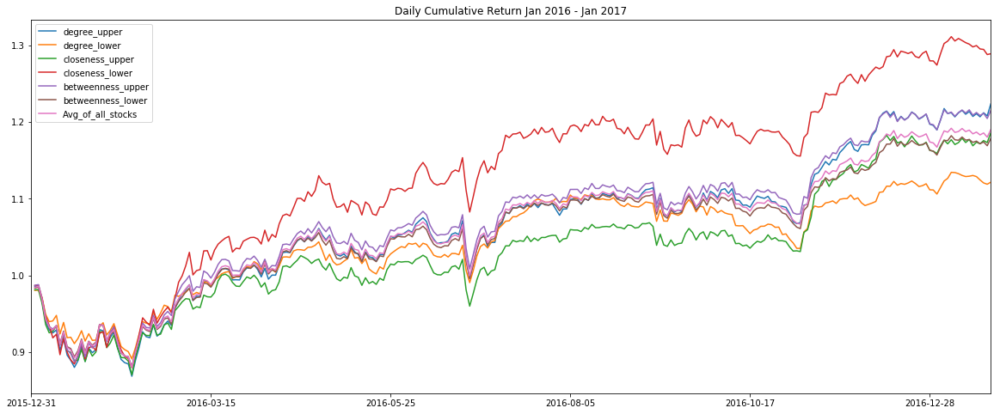

In [42]:
cumreturn_1d.plot(figsize=(20,8), title="Daily Cumulative Return Jan 2016 - Jan 2017")

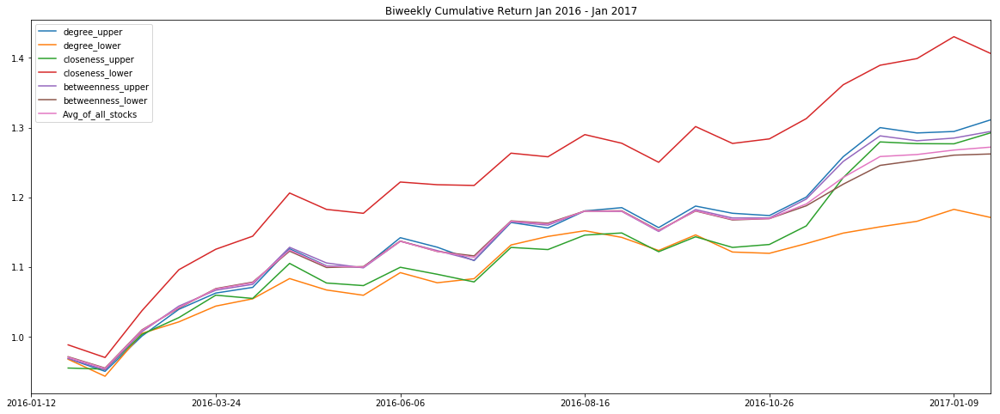

In [43]:
cumreturn_2w.plot(figsize=(20,8), title="Biweekly Cumulative Return Jan 2016 - Jan 2017")

In [44]:
returns_all2w = perform(enddate="2017-01-24", startdate='2006-01-03',space=10)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


In [45]:
cumreturn_all2w = returns_all2w.cumprod()
returns_all2w.cumprod().iloc[-1,:]

degree_upper         2.85509
degree_lower         4.28363
closeness_upper       2.6818
closeness_lower      3.72435
betweenness_upper     2.8528
betweenness_lower    3.18186
Name: 2017-01-24, dtype: object

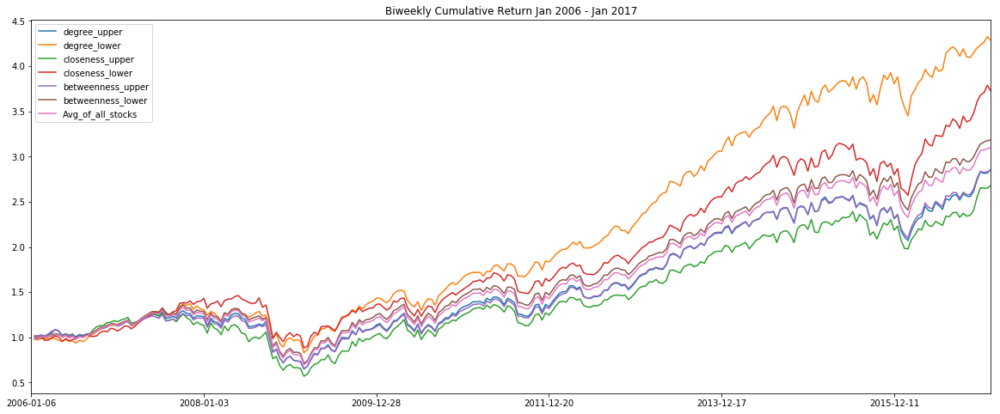

In [46]:
avg_all2w = avgreturn(enddate="2017-01-24", startdate='2006-01-03',space=10)
cumreturn_all2w["Avg_of_all_stocks"] = pd.Series(avg_all2w[1]).values
cumreturn_all2w.plot(figsize=(20,8), title="Biweekly Cumulative Return Jan 2006 - Jan 2017")

In [47]:
returns_5y2w = perform(enddate="2017-01-24", startdate='2012-01-03',space=10)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


In [48]:
cumreturn_5y2w = returns_5y2w.cumprod()
returns_5y2w.cumprod().iloc[-1,:]

degree_upper         2.04832
degree_lower         2.28658
closeness_upper      2.07315
closeness_lower      2.25256
betweenness_upper    2.08258
betweenness_lower    2.09175
Name: 2017-01-24, dtype: object

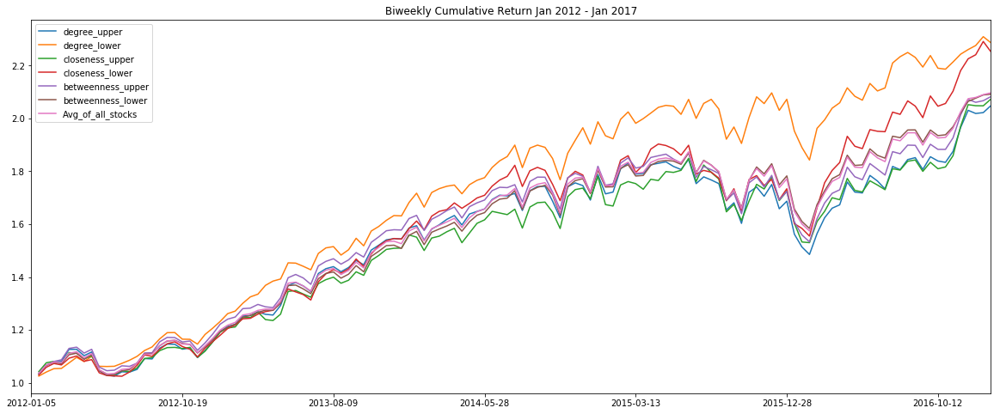

In [49]:
avg_5y2w = avgreturn(enddate="2017-01-24", startdate='2012-01-03',space=10)
cumreturn_5y2w["Avg_of_all_stocks"] = pd.Series(avg_5y2w[1]).values
cumreturn_5y2w.plot(figsize=(20,8), title="Biweekly Cumulative Return Jan 2012 - Jan 2017")

In [68]:
def draw_performance(filename="SP100_prices.csv", window=250, enddate="2017-01-24", startdate='2015-12-30',space=1):
    returns = perform(filename, window, enddate, startdate, space)
    cumreturn = returns.cumprod()
    print(returns.cumprod().iloc[-1,:])
    avg = avgreturn(enddate=enddate, startdate=startdate, space=space)
    cumreturn["Avg_of_all_stocks"] = pd.Series(avg[1]).values
    cumreturn.plot(figsize=(20,8), title="Biweekly Cumulative Return "+startdate+" - "+enddate)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper         1.20611
degree_lower         1.12773
closeness_upper      1.18063
closeness_lower      1.29005
betweenness_upper    1.20404
betweenness_lower    1.17459
Name: 2016-12-30, dtype: object


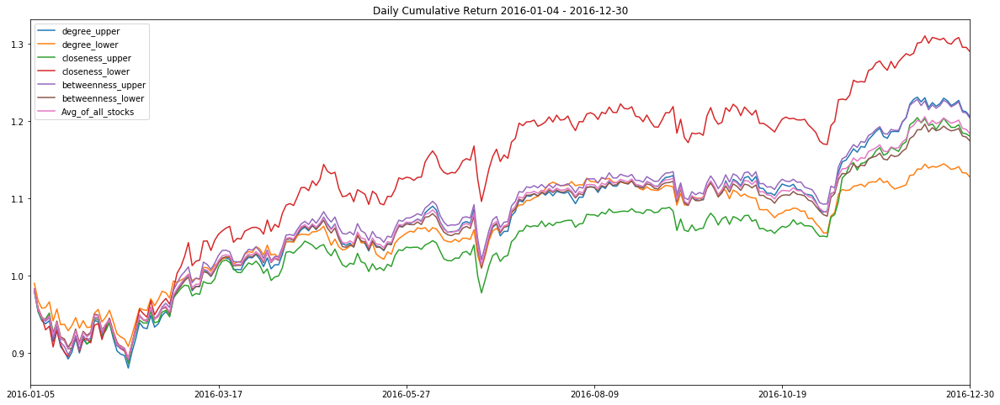

In [51]:
draw_performance(enddate="2016-12-30", startdate='2016-01-04')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper         0.981631
degree_lower          1.06618
closeness_upper       1.00726
closeness_lower      0.999759
betweenness_upper    0.981295
betweenness_lower     1.00901
Name: 2015-12-31, dtype: object


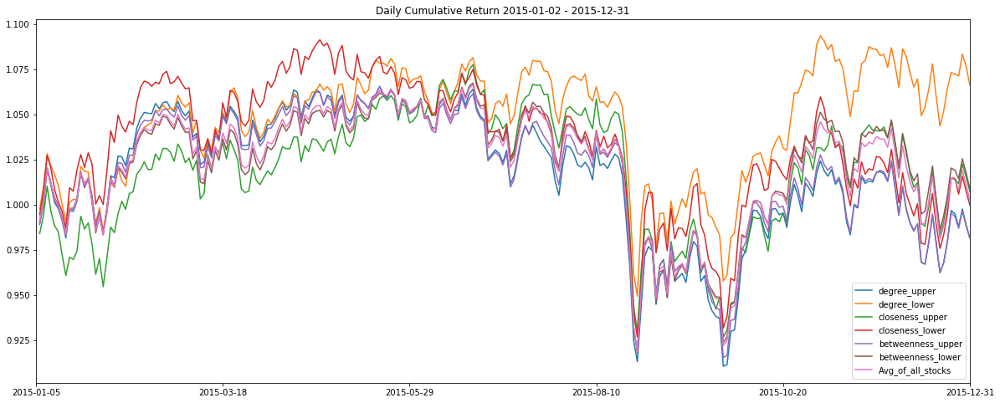

In [52]:
draw_performance(enddate="2015-12-31", startdate='2015-01-02')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper         1.11452
degree_lower         1.17105
closeness_upper       1.1381
closeness_lower      1.16066
betweenness_upper    1.11069
betweenness_lower    1.14941
Name: 2014-12-31, dtype: object


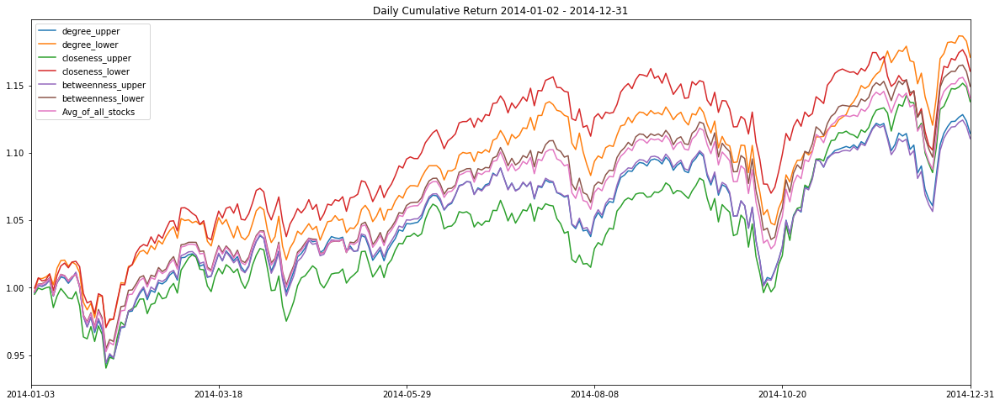

In [53]:
draw_performance(enddate="2014-12-31", startdate='2014-01-02')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper         1.35135
degree_lower         1.37766
closeness_upper      1.33045
closeness_lower      1.32819
betweenness_upper    1.34955
betweenness_lower    1.32763
Name: 2013-12-31, dtype: object


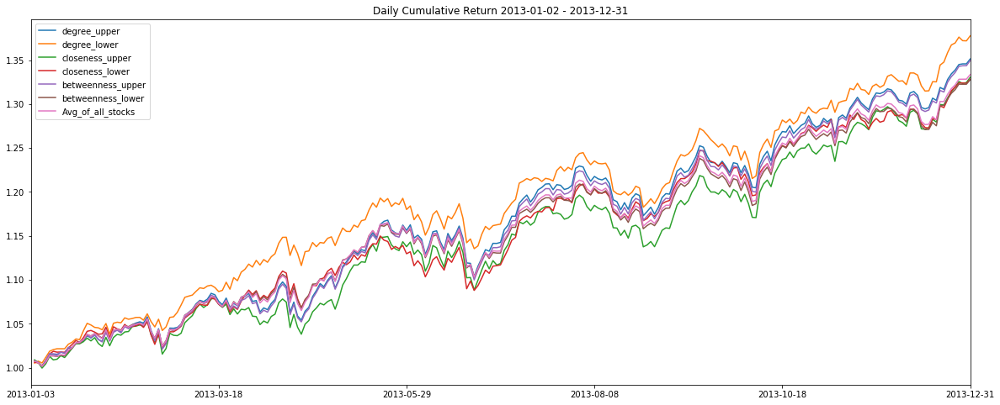

In [54]:
draw_performance(enddate="2013-12-31", startdate='2013-01-02')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper         1.15717
degree_lower         1.19239
closeness_upper      1.15796
closeness_lower      1.14899
betweenness_upper    1.17587
betweenness_lower    1.16008
Name: 2012-12-31, dtype: object


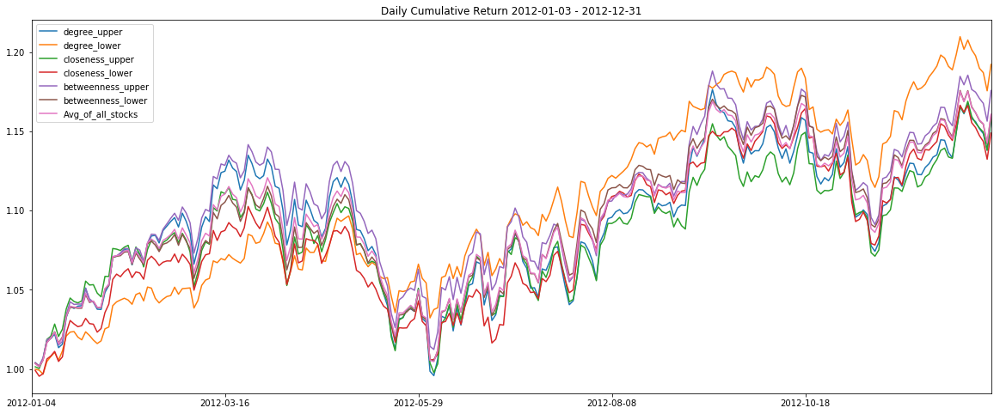

In [55]:
draw_performance(enddate="2012-12-31", startdate='2012-01-03')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper           1.366
degree_lower         1.37283
closeness_upper       1.3742
closeness_lower      1.24526
betweenness_upper    1.33519
betweenness_lower    1.37461
Name: 2009-12-31, dtype: object


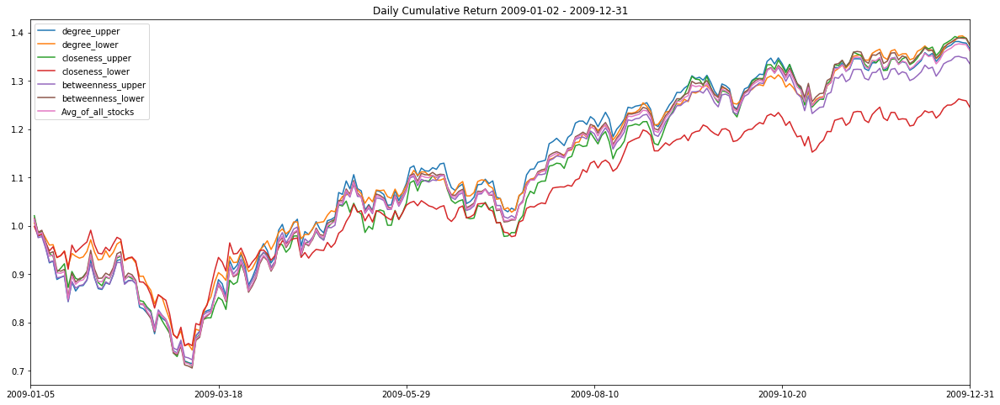

In [56]:
draw_performance(enddate="2009-12-31", startdate='2009-01-02')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper          1.3068
degree_lower         1.40092
closeness_upper      1.44523
closeness_lower      1.27665
betweenness_upper    1.31338
betweenness_lower    1.40081
Name: 2009-12-31, dtype: object


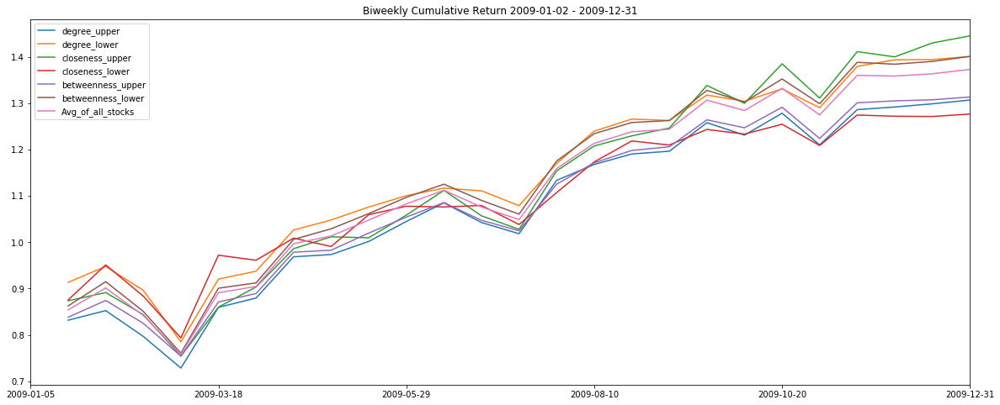

In [69]:
draw_performance(enddate="2009-12-31", startdate='2009-01-02', space=10)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper         0.646249
degree_lower         0.761225
closeness_upper      0.658764
closeness_lower       0.77878
betweenness_upper    0.680901
betweenness_lower    0.707155
Name: 2008-12-31, dtype: object


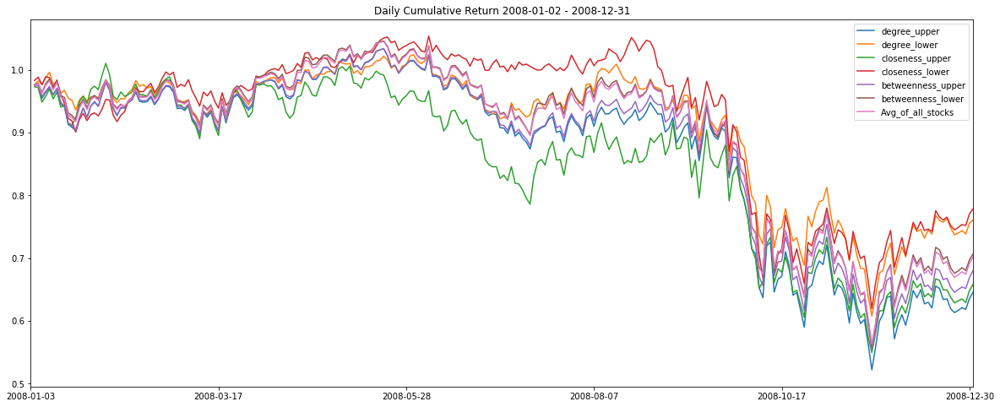

In [57]:
draw_performance(enddate="2008-12-31", startdate='2008-01-02')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper         0.658796
degree_lower         0.787751
closeness_upper      0.673669
closeness_lower      0.735137
betweenness_upper    0.687194
betweenness_lower    0.700366
Name: 2008-12-31, dtype: object


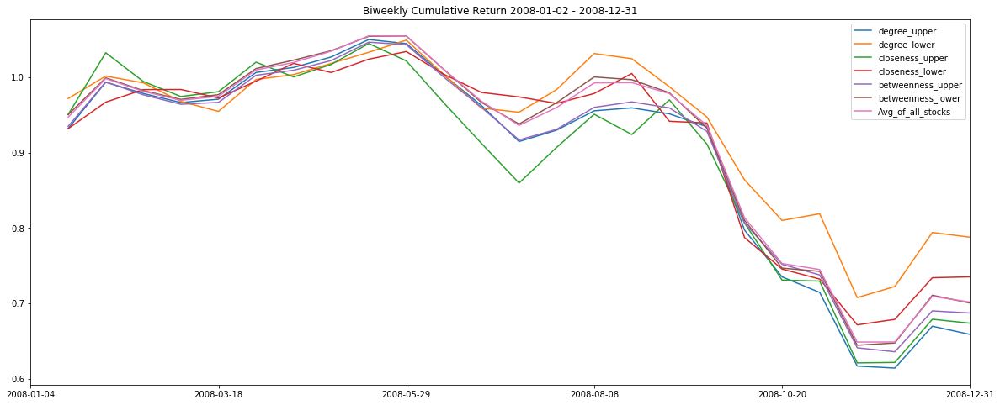

In [70]:
draw_performance(enddate="2008-12-31", startdate='2008-01-02', space=10)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper          1.10836
degree_lower          1.16947
closeness_upper      0.989551
closeness_lower       1.35049
betweenness_upper     1.09942
betweenness_lower     1.13543
Name: 2007-12-31, dtype: object


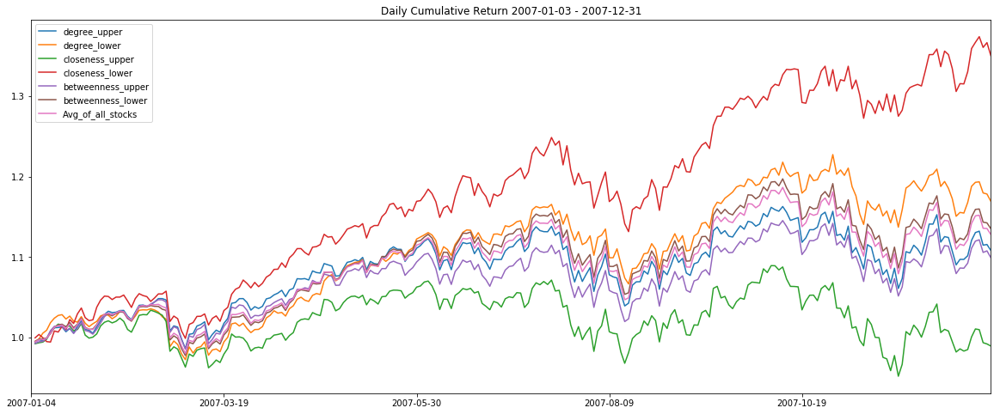

In [58]:
draw_performance(enddate="2007-12-31", startdate='2007-01-03')

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower
degree_upper          1.09304
degree_lower          1.15273
closeness_upper      0.974263
closeness_lower       1.34226
betweenness_upper     1.07214
betweenness_lower     1.12225
Name: 2007-12-31, dtype: object


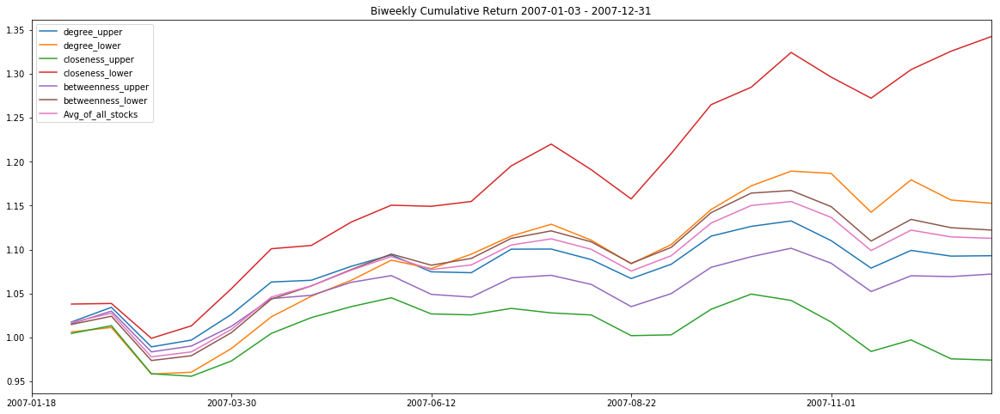

In [71]:
draw_performance(enddate="2007-12-31", startdate='2007-01-03', space=10)

In [59]:
returns_07 = perform(enddate="2007-12-31", startdate='2007-10-19',space=1)

degree
upper
lower
closeness
upper
lower
betweenness
upper
lower


In [60]:
returns_07

,degree_upper,degree_lower,closeness_upper,closeness_lower,betweenness_upper,betweenness_lower
2007-10-22,NaN,NaN,NaN,NaN,NaN,NaN
2007-10-23,1.00897,1.01571,1.00698,1.01249,1.00973,1.01025
2007-10-24,1.00003,0.993747,1.00012,0.99992,0.999939,0.997479
2007-10-25,1.00272,1.00093,0.993483,1.00638,1.00225,1.00116
2007-10-26,1.01338,1.00834,1.0143,1.01185,1.01295,1.01324
2007-10-29,1.00301,1.00239,1.00359,1.00456,1.00355,1.00418
2007-10-30,0.987993,0.997726,0.994449,0.981755,0.987314,0.994192
2007-10-31,1.01312,1.01751,1.00897,1.01533,1.01328,1.01432
2007-11-01,0.97402,0.980108,0.970484,0.979978,0.976483,0.973575
2007-11-02,1.00136,1.00439,0.999655,1.01081,1.00388,1.00221


In [61]:
# test
df = importdata("SP100_prices.csv")[1]
corr = corr_matrix(df, window=250, enddate="2009-06-12", method="gower")
G = constructgraph(corr)
T = nx.minimum_spanning_tree(G, "weight")

In [62]:
bw = nx.betweenness_centrality(T)

In [63]:
wdc = weighted_degree_centrality(T)
wdc

{'AAPL': 0.007978458170338489,
 'ABT': 0.007947228883390726,
 'ACN': 0.0075114615389903425,
 'AIG': 0.00641745732653633,
 'ALL': 0.008819466686865639,
 'AMGN': 0.007184165047301323,
 'AMZN': 0.00776858953801843,
 'APA': 0.010024065510297785,
 'APC': 0.009891922433834334,
 'AXP': 0.00862265489824787,
 'BA': 0.00839794188606048,
 'BAC': 0.01798942078826514,
 'BAX': 0.015438481115335124,
 'BIIB': 0.006830227337419875,
 'BK': 0.008754254629725997,
 'BMY': 0.007523521612375745,
 'C': 0.014806031345705763,
 'CAT': 0.008701446124911716,
 'CL': 0.008030741070412246,
 'CMCSA': 0.008435231406141766,
 'COF': 0.0086426568572683,
 'COP': 0.009980569627625445,
 'COST': 0.0077849166373402485,
 'CSCO': 0.00930295253507554,
 'CVS': 0.007593293057873987,
 'CVX': 0.028199900746443723,
 'DD': 0.01656156533995731,
 'DIS': 0.008603518766292116,
 'DOW': 0.007599330951263421,
 'DVN': 0.009759558108837543,
 'EBAY': 0.007999461501252253,
 'EMC': 0.0076192131085314994,
 'EMR': 0.008784606566584925,
 'EXC': 0.008

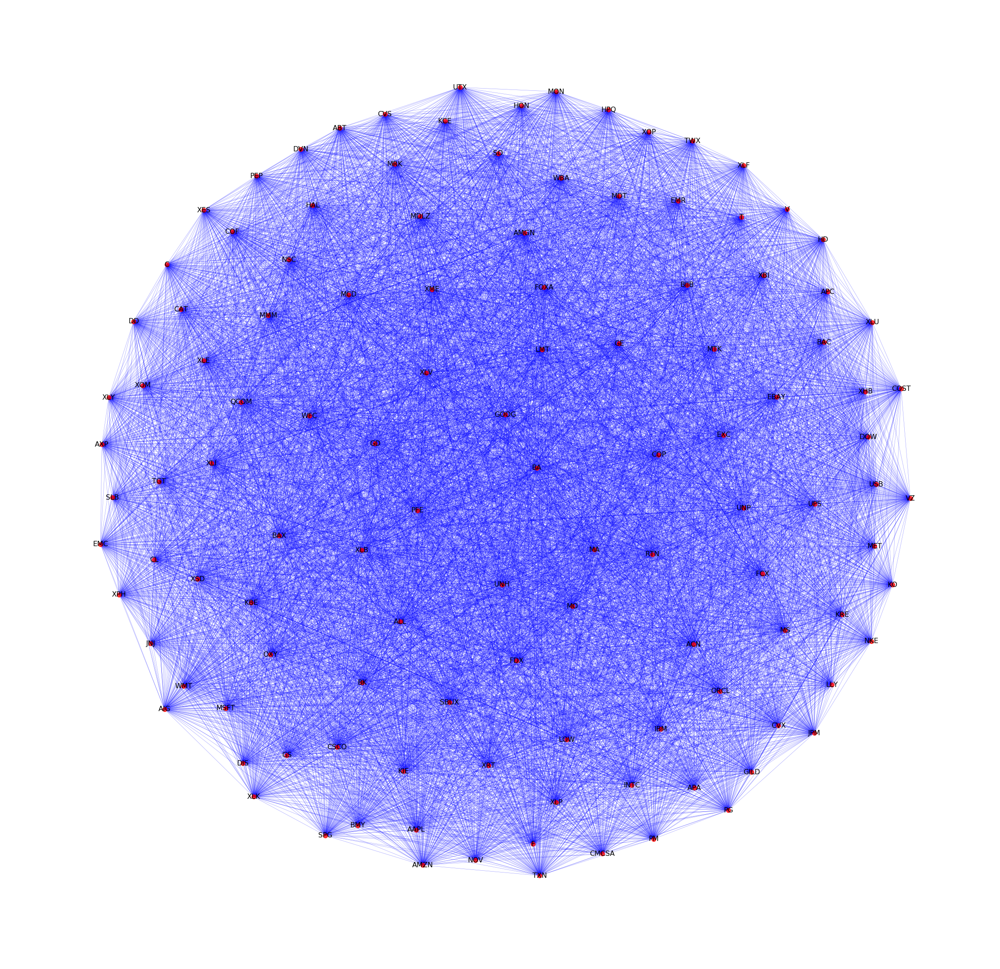

In [64]:
draw_network(G)

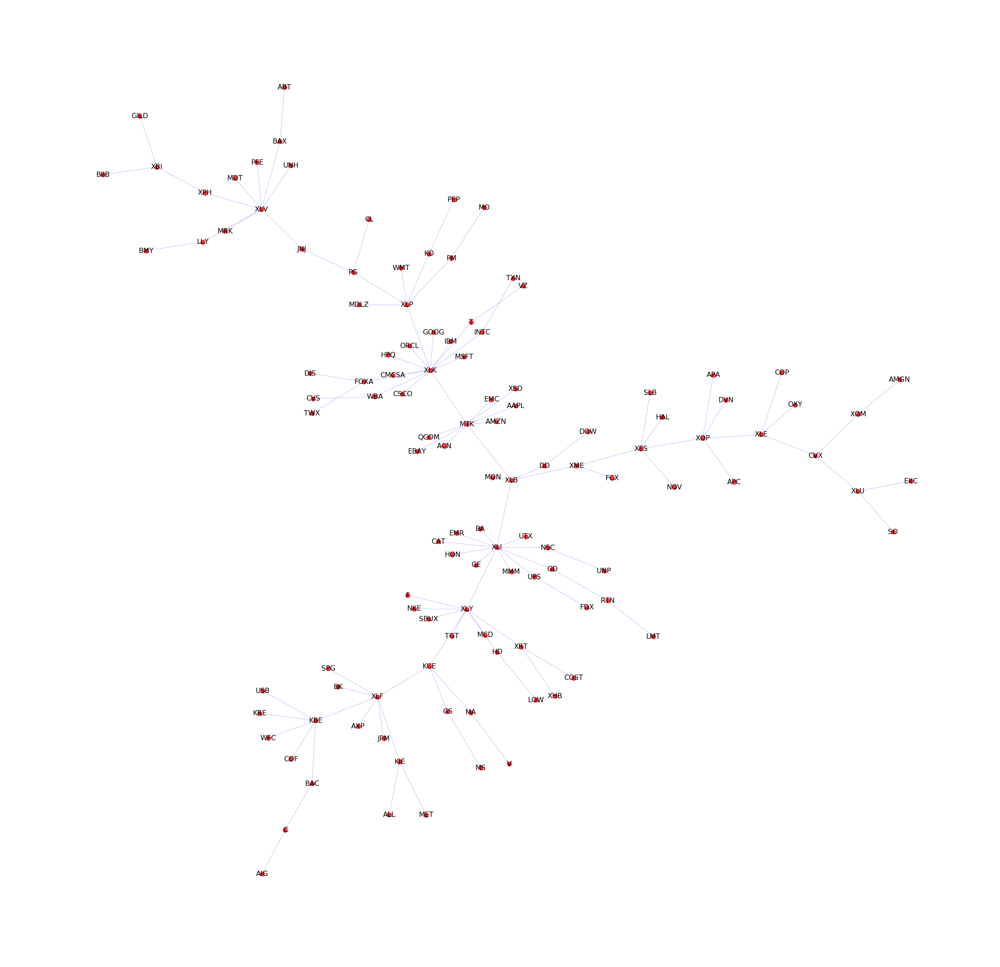

In [65]:
draw_network(T)

In [66]:
pricedf, log_ret = importdata("SP100_prices.csv")
dic = rolling_corr(log_ret, window=250, enddate="2014-10-24", startdate='2015-12-30',space=1)
portfolios = getportfolio(dic, "degree", "upper")

In [67]:
dates = sorted(dic.keys())
i = 3
c = dates[i]
n = dates[i+1]
pf = portfolios[c]
p_current = pricedf.loc[c, pf]
p_next = pricedf.loc[n, pf]
re = np.nanmean(p_next/p_current)

IndexError: list index out of range

In [ ]:
re

In [ ]:
import matlab.engine
eng = matlab.engine.start_matlab()

In [ ]:
matrix = log_ret.as_matrix().T

In [ ]:
mat = matrix[50:57,200:210]

In [ ]:
mat

In [ ]:
r,c = mat.shape

In [ ]:
data_list = mat.tolist()

In [ ]:
data = matlab.double(data_list)

In [ ]:
a,b = eng.MainDiversification(data,r,c,nargout=2)

In [ ]:
a

In [ ]:
b

In [ ]:
ar = np.array(a)
ar

In [ ]:
br = np.array(b)
br